<h1><center>Primary Education Across Multiple Countries</center></h1>
<h4><center>
<a style="text-decoration:none" href="https://github.com/varunb0801">Aditya Shakya</a>, IIT Gandhinagar, <a style="text-decoration:none" href="mailto:barala.v@iitgn.ac.in">s.aditya@iitgn.ac.in</a>
<br><br>
<a style="text-decoration:none" href="https://github.com/Shaan-403">Shantanu Sahu</a>, IIT Gandhinagar, <a style="text-decoration:none" href="mailto:shantanu.s@iitgn.ac.in">shantanu.s@iitgn.ac.in</a>
<br><br>
<a style="text-decoration:none" href="https://github.com/Aditya-Shakya3000">Varun Barala</a>, IIT Gandhinagar, <a style="text-decoration:none" href="mailto:s.aditya@iitgn.ac.in">barala.v@iitgn.ac.in</a>
</center></h4>

[![Repo](https://img.shields.io/badge/GitHub-<repo_name>-brightgreen)](https://github.com/<repo_user>/<repo_name>)

# DataSet Explanation

The data was downloaded in a comma separated values format from UNICEF's website and may be found here: https://data.unicef.org/topic/education/primary-education/

One column in the initial data file was for the nation, another for Type, and the other columns were for the years 1960 to 2020. We did, however, alter the columns and rows to make them more usable. As a result, each row included one column for country, one column for year, and the remaining 16 columns had various types of information for various nations for all years. It includes statistics on girls and boys proportion of primary education through time, as well as data on primary students in general and females specifically. The number of overall teachers in the primary school sector for all nations was also represented in the data. The number of elementary teachers for males and females is separated in this data. It also showed the percentage of trained teachers in the primary and pre-primary sectors, divided into male, female, and overall categories. 
It also displayed the net enrolment of female vs. male primary school teachers, as well as the overall gross intake of males and females for various nations. For a given year and nation, each cell would have the value corresponding to that category. However, data for all years and categories for each nation was not accessible. As a result, the years 1960 to 2000 were excluded. We had a separate sheet for expenditures, in which we took years from 2000 to 2020 and only included nations with data accessible for at least 15 years. We may either replace the NAN value with a more acceptable value, such as the statistical mean/median or a constant, or we can remove it entirely using dropna (). The entries in the spending sheet were filled using the mean value of all years. Fillna() or the apply function in Python can be used to fill NAN values.

In [1]:
from IPython.display import HTML
HTML('''<button type="button" class="btn btn-outline-danger"  onclick="codeToggle();">Toggle Code</button>''')

In [15]:
{
    "tags": [
        "hide-input",
    ]
}
#2000-2020
#x-axis -> %male
#y-axis -> %female
#size -> max(total teachers)
#Animation -> year
from plotly.offline import plot, iplot, init_notebook_mode
init_notebook_mode(connected=True)
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px
#from google.colab import files
import plotly.graph_objects as go

df = pd.read_csv('./data/Data_final.csv')

mean_value=df['Primary Trained Male'].mean()
df['Primary Trained Male'].fillna(value=mean_value, inplace=True)

mean_value=df['Primary Trained Female'].mean()
df['Primary Trained Female'].fillna(value=mean_value, inplace=True)

x = {*()}
for i in range(16226):
  y = df.iloc[i]['Country Name']
  x.add(y) 

country_name = list(x)


year = []

for i in range(2000,2021):
  year.append(i)


for y in range(2000,2021):
  x_arr = []
  y_arr = []
  ratio = []
  for i in range(16226):
    if(df.iloc[i]['Year'] == y):
      if(df.iloc[i]['Primary Trained Male']!=0):
        x_arr.append(df.iloc[i]['Primary Trained Male'])
        y_arr.append(df.iloc[i]['Primary Trained Female'])
        ratio.append(df.iloc[i]['Primary Trained Female']/df.iloc[i]['Primary Trained Male'])
      else:
        x_arr.append(df.iloc[i]['Primary Trained Male'])
        y_arr.append(df.iloc[i]['Primary Trained Female'])
        ratio.append(0)
            

  fig = px.scatter(df, x=x_arr, y=y_arr,size=ratio, hover_data=[country_name], color = country_name, title = "Female Trained Teachers / Male Trained Teachers in different countries"+str(" ")+str( y), labels=dict(x="Primary Trained Male (%)", y="Primary Trained Female (%)", color="Place"))

  fig.show()


# print(ratio)
# new_ratio = np.array([x*2000 for x in ratio])

The proportion of Primary Trained Male teachers vs the percentage of Primary Trained Female teachers is displayed year by year in the graph above. The various coloured circles represent various countries. However, because we don't have enough data for a few nations, some of the bubbles are outliers for which no conclusions can be drawn. The fillna() method was used to fill NaN values with the column mean.

Overall, the percentage of Trained Male and Trained Female instructors has grown from 2000 to 2020, as seen in the graph. In several nations in the year 2000, the percentage of trained male and female teachers was less than 50%. However, by 2020, most nations will have approximately 100% trained male and female elementary school teachers. We can observe that in 2000, nations like Zambia had a substantially lower percentage of both female and male certified teachers (45 percent both), yet the ratio remained at around 1.4. Countries like Austria, the Philippines, and Gabon, on the other hand, have nearly 100% trained instructors, with a ratio of about 1. Bangladesh has a far higher proportion of female-trained teachers than male-trained teachers in 2005. Males have a lower proportion of trained teachers than females in recent years in nations like Lucia and many Western African countries.


Recently, in 2020, Bahrain reported having 100% trained teachers for primary education. This data remained consistent with the 2019 numbers. From 2011 to 2020, the average of trained teachers in Bahrain is around 83%. In 2011, Bahrain reported around 80% of trained teachers in both male and female categories. From 2011 to 2017, the ratio of trained teachers in primary education increased gradually. Whereas, from 2017 to 2018, it was a sudden increase. The data shows that the percentage of trained female teachers in Bahrain is slightly more significant than that of trained male teachers. There is no gender discrimination in Bahrain as per their constitution, formed in 2002. The result of having more trained female teachers than males shows Bahrain's openness. Another reason for the increase in the number of trained teachers can be due to the Internet. With the help of the Internet, more teachers in Bahrain can become trained professionals.
 
A few Caribbean countries lag in terms of primary education. However, the percentage of female trained teachers is significantly higher than their male counterparts. In fact, most teachers in Caribbean countries are female. Over the years, trained female teachers have increased from 77% to around 88%; whereas the number of trained male teachers shows only a four per cent increase. Due to factors such as low-level remuneration, many trained teachers leave the profession to take up more lucrative posts in the private sector or migrate to countries like the Bahamas.

Ghana has experienced a drop in the percentage of trained teachers, both male and female, in recent years. Females, in particular, saw their share drop from 88 percent to 77 percent. The reason for this is because the ratio of female teachers has progressively grown, and as more instructors have arrived, training them has become increasingly challenging. Furthermore, Ghana is a country that suffers from gender inequality, with women having little rights. As a result, ladies are not trained. However, because more and more males were becoming teachers, the ratio of trained male instructors first declined, making it difficult for them to be taught. The percentage of educated male instructors, on the other hand, stayed unchanged from 2000 to 2020.

In [16]:
{
    "tags": [
        "hide-input",
    ]
}
# Net Enrollment Rate
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import plotly.express as px


iris_df = pd.read_csv("./data/Data_final (1).csv", index_col = "Year")

# mean_value = iris_df['Net Enrollment Male'].mean()
# iris_df['Net Enrollment Male'].fillna(value=mean_value, inplace=True)

# mean_value = iris_df['Net Enrollment Female'].mean()
# iris_df['Net Enrollment Female'].fillna(value=mean_value, inplace=True)

# mean_value = iris_df['Net Enrollment'].mean()
# iris_df['Net Enrollment'].fillna(value=mean_value, inplace=True)


arr = [i for i in range(1960,2000)]
iris_df.drop(arr, axis=0, inplace=True)

r = ["Net Enrollment","Net Enrollment Female","Net Enrollment Male"]
iris_df = iris_df.dropna(subset = r)


# print(iris_df.shape)
# ratio = []
# for i in range(2138):
#   ratio.append(iris_df.iloc[i]['Net Enrollment Female']/iris_df.iloc[i]['Net Enrollment Male'])
# # print(ratio)

# iris_df['ratio'] = ratio

# print(iris_df.ratio)
# r = ["Net Enrollment","Net Enrollment Female","Net Enrollment Male"]
# iris_df = iris_df.dropna(subset = r)


# print(iris_df.head)
iris_df['Year1'] = iris_df.index
# df['Year1']
# print(iris_df.Year1)
# display(iris_df.Year1.to_string())
# iris_df['Net Enrollment'] = iris_df['Net Enrollment']/1000

# female_pow = []
# for i in range(2138):
#   female_pow.append( (iris_df.iloc[i]['Net Enrollment Female'])**3 )
# iris_df['female_pow'] = female_pow
iris_df = iris_df.sort_values('Year1', ascending=True)
fig = px.scatter_geo(iris_df, locations="Country Code", size="Net Enrollment Female", size_max=10, animation_group = "Country Name",
              projection="natural earth",color="Country Name", animation_frame="Year1", template="plotly_dark")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0}) 
fig.show()

This graph depicts the percentage of female students enrolled in various nations. The size of the circles indicates the percentage of women in the country. If the difference is considerable, it signifies that the percentage of women enrolled in that nation is higher than in other countries. The proportional ratio of female enrollment in elementary school in Western countries is lower than in most other countries. This is owing to the diversity of cultures in West Africa, as well as gender inequality, riots based on race, and caste. Women's education is not considered proper in Western Africa. However, we can observe that the ratio of women enrolled in such nations has risen in recent years. This is due to increased gender equality and women's empowerment awareness. We can also notice that in the year 2000, India had a female enrolment rate of roughly 70%. By 2012, however, women's empowerment and gender equality had increased the rate to over 90%. Similarly, our neighboring nation Bhutan had a female enrollment rate of 48 percent in 2012, but by 2018 it had increased to 90 percent.

This statistic demonstrates how gender equality has impacted the world. It demonstrates how the percentage of females enrolled in elementary school has risen. Modernization is to blame for these developments. As a result of women's empowerment, the ratio of females in education has improved. Education, as we all know, is crucial. As a result, more females becoming educated can transform the world in terms of women's empowerment.

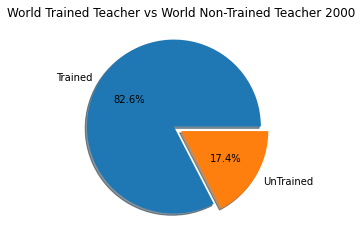

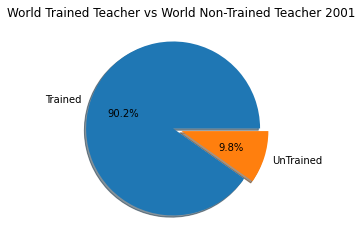

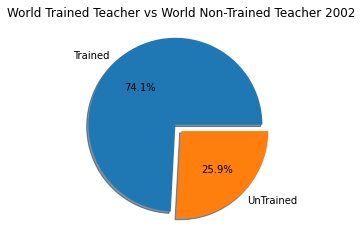

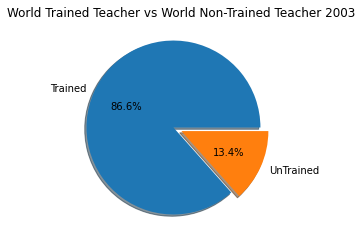

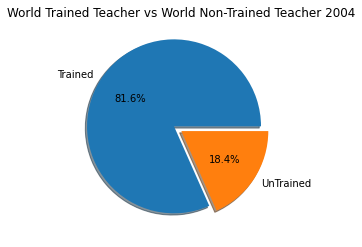

...

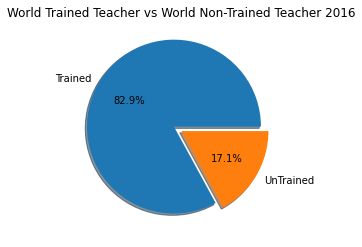

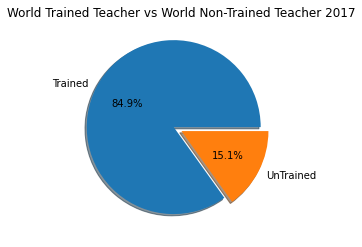

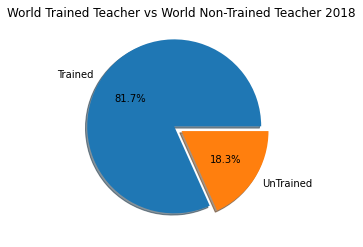

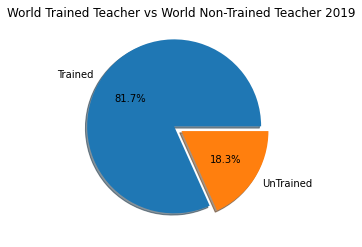

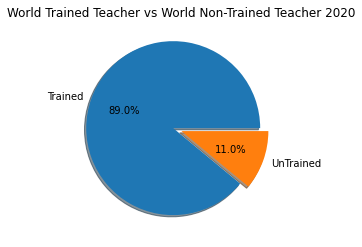

In [3]:
{
    "tags": [
        "hide-input",
    ]
}
#pie
# Trained teacher vs Total teacher
# Primary Trained vs Primary Education Teacher (number)
import plotly.express as px
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from IPython.display import HTML
#from google.colab import files

df = pd.read_csv("./data/Data_final (1).csv")
# print(df.head())

arr = [i for i in range(1960,2000)]
df.drop(arr, axis=0, inplace=True)

r = ["Primary Trained","Primary Education Teacher"]
df = df.dropna(subset = r)
# print(df.shape)
Train_no = []
for i in range(1047):
  Train_no.append(( (df.iloc[i]["Primary Trained"])*(df.iloc[i]["Primary Education Teacher"]) )/100)

df['Train_no'] = Train_no

sum_train = []
for y in range(2000,2021):
  sum_a = []
  for i in range(1047):
    if(df.iloc[i]['Year'] == y):
      sum_a.append(df.iloc[i]['Train_no'])
  sum_train.append(sum(sum_a))   

sum_total = []
for y in range(2000,2021):
  sum_a = []
  for i in range(1047):
    if(df.iloc[i]['Year'] == y):
      sum_a.append(df.iloc[i]['Primary Education Teacher'])
  sum_total.append(sum(sum_a))      

# print(sum_train)
# print(sum_total)

pie_percent = []
for i in range(21):
  pie_percent.append((sum_train[i]/sum_total[i])*100)

#change values of i in pie_percent[i] and 100-pie_percent[i] to get different pie graphs of repective year 
for i in range(21):
  y = np.array( [pie_percent[i],100-pie_percent[i]])
  mylabels = ["Trained", "UnTrained"]

  fig, ax = plt.subplots(figsize = (5,4))
  fig.set_facecolor('white')
  explode = (0.1, 0)
  plt.pie(y, labels = mylabels,autopct='%1.1f%%', explode = explode, shadow=True)
  plt.title("World Trained Teacher vs World Non-Trained Teacher"+str(" ")+ str(i+2000))
  
  # plt.savefig(str(i+2000)+".png")
  plt.show()
  
# HTML("""
# <video width="300" height="200" controls src="./assets/Pie_chart.mp4">
# </video>
# """)

Each pie chart depicts the percentage value of trained and untrained primary teachers in each year throughout the world. This component was calculated by first adding all of the primary teachers by year, and then adding all of the untrained instructors by year. The percentage of elementary school teachers who were not trained was then computed. The remaining proportion represents the number of qualified instructors.

In the year 2000, around 17% of all instructors in the globe were untrained. However, untrained instructors accounted for 27% of all teachers in 2011. Around that period, the vast majority of trained teachers were changing careers. Teaching was a low-self-esteem vocation in the past. As a result, all skilled professionals left their employment and applied for higher-ranking jobs with greater wages. The percentage of unqualified instructors steadily rose as a result of this. In 2011, a greater number of individuals became aware of the importance of basic education in a country. As a result, more teachers were being educated, and people were once again interested in teaching. Recognizing the importance of primary education, every country tries to attract more teachers by paying them well and preparing them through competitive assessments. As a result, the share of unskilled instructors is gradually decreasing in the pie chart. In addition, from 2019 to 2020, we expect a 7% decline in the share of unqualified instructors. The reason for this is that we switched from offline to online mode because of Covid. It was simpler to train more instructors since there was an option for online training, which helped to expand the number of trained teachers. We find a net decline in untrained instructors from 2000 to 2020. As a result, this offers a favorable view of the globe as a whole as it progresses toward modernity and education.

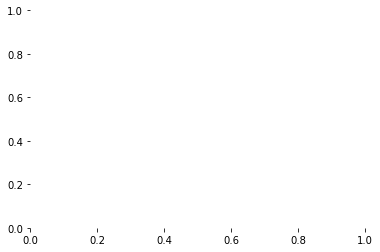

In [2]:

import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.animation as animation
from IPython.display import HTML
import random


df = pd.read_csv("./data/expen.csv", usecols=['Country Name', 'Year', 'Value', 'Country Code'], index_col="Year")
arr = [i for i in range(1960,2000)]
df.drop(arr, axis=0, inplace=True)

r = ["Value"]
df = df.dropna(subset = r)

df['year'] = df.index

fig, ax = plt.subplots(figsize=(20, 30))
fig.set_facecolor('white')

x = {*()}
for i in range(1176):
  y = df.iloc[i]['Country Code']
  x.add(y) 

country_code = list(x)

get_colors = lambda n: list(map(lambda i: "#" + "%06x" % random.randint(0, 0xFFFFFF),range(n)))
color = get_colors(133)

colors = dict(zip(country_code,color))
group_lk = df.set_index('Country Name')['Country Code'].to_dict()


def draw_barchart(year):
    dff = df[df['year'].eq(year)].sort_values(by='Value', ascending=True)
    ax.clear()
    ax.barh(dff['Country Name'], dff['Value'], color=[colors[group_lk[x]] for x in dff['Country Name']])

    for i, (value, name) in enumerate(zip(dff['Value'], dff['Country Name'])):
        ax.text(value, i,     name,           size=14, weight=600, ha='right', va='bottom')
        ax.text(value, i, group_lk[name], size=10, color='#444444', ha='right', va='baseline')
        ax.text(value, i,     f'{value:,.0f}',  size=14, ha='left',  va='center')

    ax.text(1, 0.4, year, transform=ax.transAxes, color='#777777', size=46, ha='right', weight=800)
    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
    ax.xaxis.set_ticks_position('top')
    ax.tick_params(axis='x', colors='#777777', labelsize=12)
    ax.set_yticks([])
    ax.margins(0, 0.01)
    ax.grid(which='major', axis='x', linestyle='-')
    ax.set_axisbelow(True)
    ax.text(0, 1.12, 'Expenditure of countires in different years',
            transform=ax.transAxes, size=24, weight=600, ha='left')
    plt.box(False)
    
draw_barchart(2018)

animator = animation.FuncAnimation(fig, draw_barchart, frames=range(2000, 2021),interval=1000)
plt.close()
animator
HTML(animator.to_jshtml())

After processing the Nan numbers and visualizing the results, we can see that underdeveloped nations spend more on elementary education as a percentage of overall education spending. In contrast, wealthy nations spend less on elementary education as a percentage of total education spending. Finland, for example, has the greatest literacy rate in the world, although it spends less on basic education than on higher education. West Africa, on the other hand, spends more than half of its overall budget on basic education. Because elementary education is a crucial investment in a country's development, it requires a greater attention in underdeveloped and emerging countries.
 
Similarly, we can observe that between 2000 and 2012, the percentage spent on elementary education in South Africa increased. Since then, numerous South African countries have developed to the point where the focus has switched from basic to secondary education.

OVERALL CONCLUSION

The overarching conclusion is that every country recognises the value of basic education. Primary education is a critical investment for all countries, both developing and developed.